# Skin Lesion Classification (Adapted from Yasona Neocleous' Code)

In [66]:
#Importing libraries
import pandas as pd
from sklearn.datasets import make_classification 
from sklearn.linear_model import LogisticRegression 
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import math
import os
import random
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
import glob
from PIL import Image
from pathlib import Path
from sklearn.utils.class_weight import compute_class_weight
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import functional as F
from tqdm import tqdm
import missingno as msno
import cv2
import shutil
from collections import Counter

In [3]:
pip install opencv-python==4.5.5.62

Reason for being yanked: deprecated, use 4.5.5.64
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 5.2 MB/s eta 0:00:0000:0100:01m
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.11.0.86
    Uninstalling opencv-python-4.11.0.86:
      Successfully uninstalled opencv-python-4.11.0.86
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torch torchvision

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


## Initial Exploration of Data

In [12]:
# Loading and reading Ground Truth Data CSV file
df = pd.read_csv('/Users/inescocco/Desktop/ISIC2019_2/ISIC_2019_Training_GroundTruth.csv')
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
#### merge the columns into one column###
#each class
#array opf column names
columns = np.array(df.iloc[:,1:].columns)
print(columns)
new_val = 1
df_comb = df
for col in df_comb.iloc[:,1:].columns:
    #replace with new values
    df_comb[col] = df_comb[col].replace(1.0, new_val)
    #add 1 to value
    new_val += 1

df_comb['Label'] = df_comb['MEL'] + df_comb['NV'] + df_comb['BCC']+df_comb['AK']+df_comb['BKL']+df_comb['DF']+df_comb['VASC']+df_comb['SCC']+df_comb['UNK']
df_labels = df_comb.drop(columns, axis = 1)
print(df_labels.head())

['MEL' 'NV' 'BCC' 'AK' 'BKL' 'DF' 'VASC' 'SCC' 'UNK']
          image  Label
0  ISIC_0000000    2.0
1  ISIC_0000001    2.0
2  ISIC_0000002    1.0
3  ISIC_0000003    2.0
4  ISIC_0000004    1.0


Label
2.0    12875
1.0     4522
3.0     3323
5.0     2624
4.0      867
8.0      628
7.0      253
6.0      239
Name: count, dtype: int64
[2. 1. 5. 6. 8. 3. 7. 4.]
[4522, 12875, 3323, 867, 2624, 239, 253, 628]


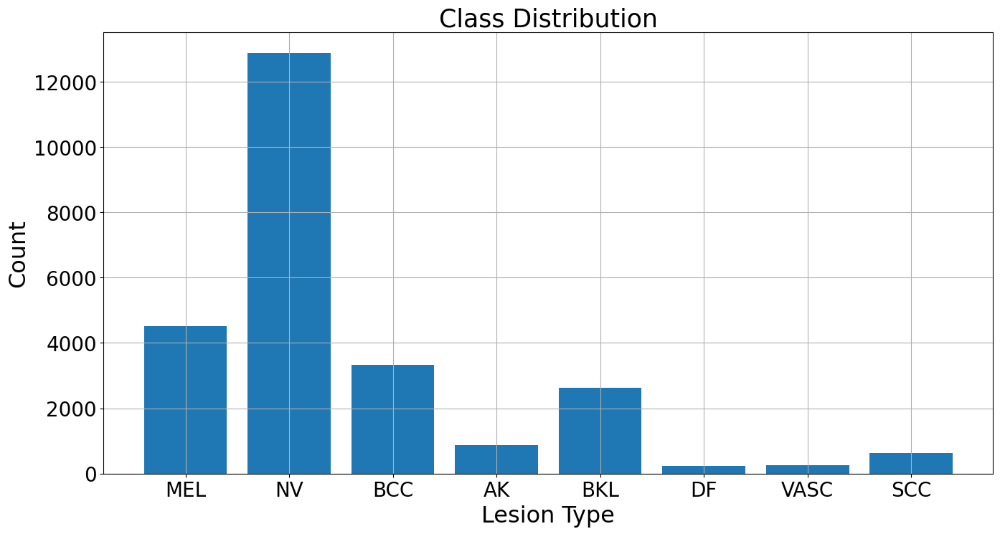

In [70]:
print(df_labels['Label'].value_counts())
print(df_labels['Label'].unique())
#for each unique value get its value_counts
totals = []
for i in range(1,len(df_labels['Label'].unique())+1):
    totals.append((df_labels['Label'] == i).sum())
print(totals)

# Visualising data
plt.figure(figsize=(16,8))
plt.bar(df.iloc[:,1:9].columns,totals)
plt.xlabel("Lesion Type", fontsize=23)
plt.ylabel("Count", fontsize=23)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=20) 
plt.title('Class Distribution', fontsize = 25)
plt.grid(True)

We can see a class imbalance in the data, which will be dealt with later on.

In [24]:
df_meta = pd.read_csv('/Users/inescocco/Desktop/ISIC2019_2/ISIC_2019_Training_Metadata.csv')
df_meta.head()

,image,age_approx,anatom_site_general,lesion_id,sex
0,ISIC_0000000,55.0,anterior torso,NaN,female
1,ISIC_0000001,30.0,anterior torso,NaN,female
2,ISIC_0000002,60.0,upper extremity,NaN,female
3,ISIC_0000003,30.0,upper extremity,NaN,male
4,ISIC_0000004,80.0,posterior torso,NaN,male


age_approx
45.0    2585
50.0    2489
40.0    2246
55.0    2170
70.0    2120
65.0    2075
60.0    2036
75.0    1796
35.0    1651
80.0    1459
85.0    1319
30.0    1199
25.0     677
20.0     388
15.0     375
10.0     142
5.0      113
0.0       54
Name: count, dtype: int64


Text(0.5, 1.0, 'Age Distribution')

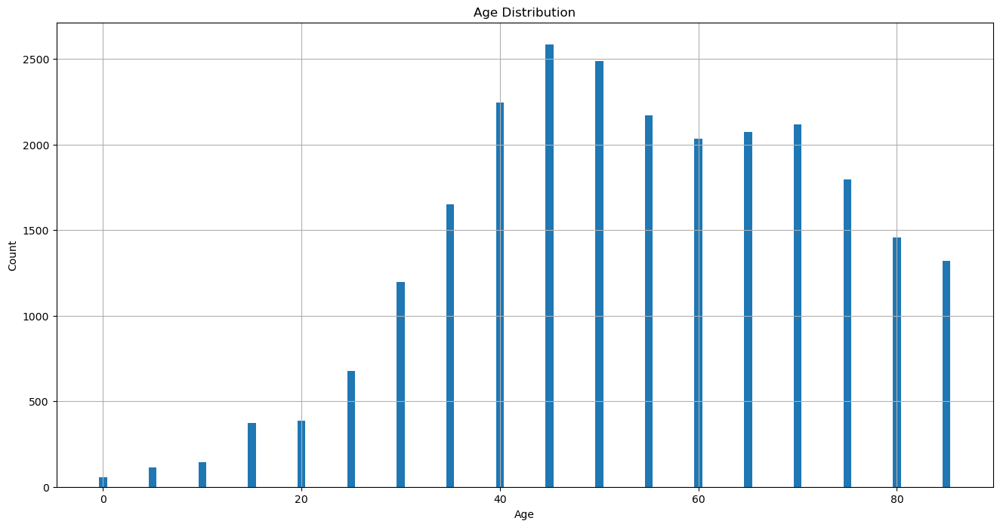

In [26]:
print(df_meta['age_approx'].value_counts())

age_range = np.linspace(0,85,18)
age_totals = []
for i in age_range:
    age_totals.append((df_meta['age_approx'] == i).sum())

plt.figure(figsize=(16,8))
plt.bar(age_range,age_totals)
plt.grid(True)
plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age Distribution")

Text(0.5, 1.0, 'Gender Distribution')

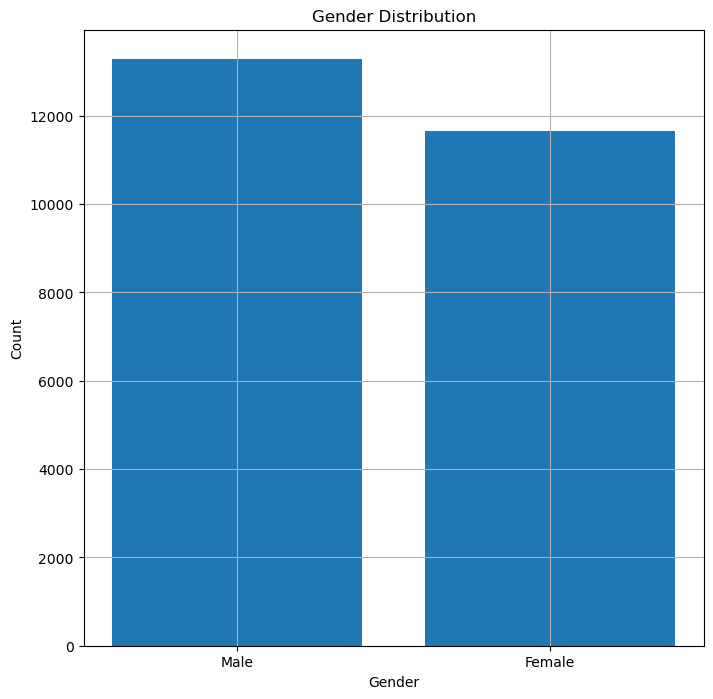

In [28]:
plt.figure(figsize=(8,8))
plt.bar(["Male","Female"],df_meta['sex'].value_counts())
plt.grid(True)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Gender Distribution")

anatom_site_general
anterior torso     6915
lower extremity    4990
head/neck          4587
upper extremity    2910
posterior torso    2787
palms/soles         398
oral/genital         59
lateral torso        54
Name: count, dtype: int64
['anterior torso' 'upper extremity' 'posterior torso' 'lower extremity'
 nan 'lateral torso' 'head/neck' 'palms/soles' 'oral/genital']


Text(0.5, 1.0, 'Lesion Site Distribution')

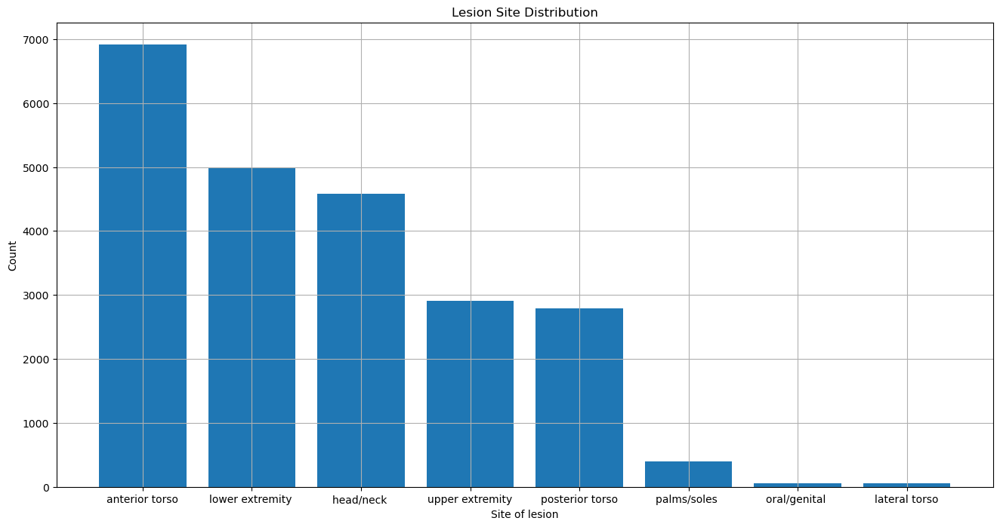

In [30]:
print(df_meta['anatom_site_general'].value_counts())
print(df_meta['anatom_site_general'].unique())

plt.figure(figsize=(16,8))
plt.bar(["anterior torso","lower extremity ","head/neck ", "upper extremity", "posterior torso","palms/soles ", "oral/genital ", "lateral torso"],df_meta['anatom_site_general'].value_counts())
plt.grid(True)
plt.xlabel("Site of lesion")
plt.ylabel("Count")
plt.title("Lesion Site Distribution")

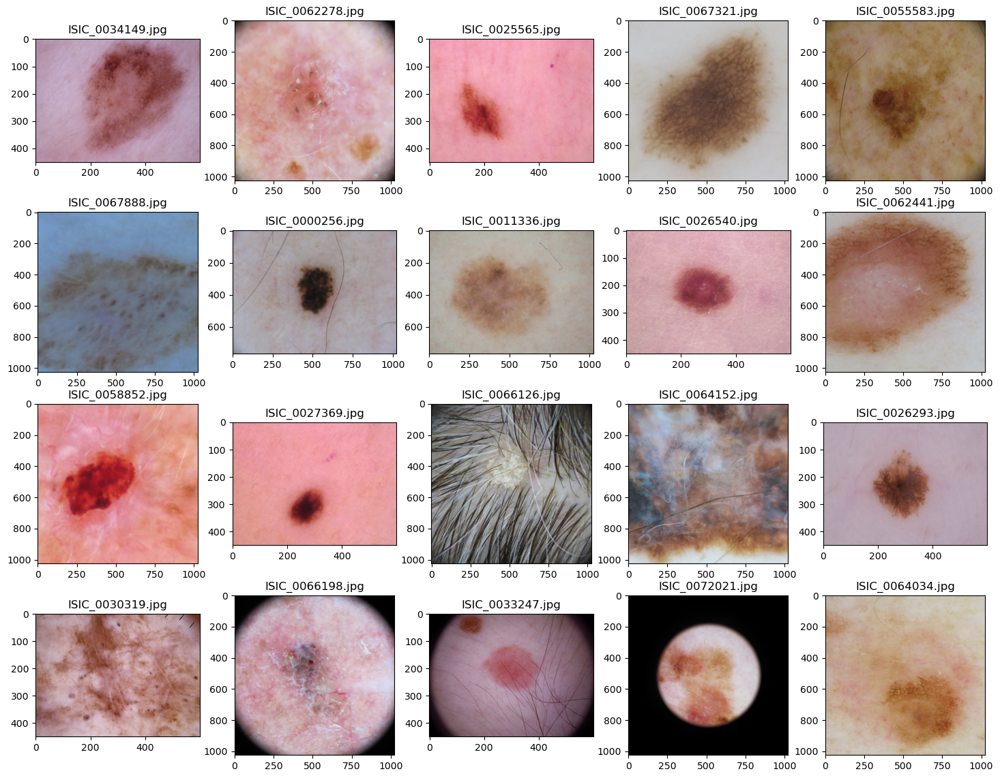

In [11]:
plt.figure(figsize=(18,14))
columns = 4
rows = 5
img_folder='/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_Input'
for i in range(20):
    file = random.choice(os.listdir(img_folder))
    image_path= os.path.join(img_folder, file)
    img=mpimg.imread(image_path)
    ax=plt.subplot(4,5,i+1)
    ax.title.set_text(file)
    plt.imshow(img)

## Stratified Split (to get 10% of Data)

In [12]:
def class_weights(no_classes, totals):
    weights_of_samples = 1/np.array(totals)
    weights_of_samples = weights_of_samples / np.sum(weights_of_samples) * no_classes
    return weights_of_samples
    
weights = class_weights(8, totals)
labels_list = np.arange(0,8,1)
weights_dic = dict(zip(labels_list,weights))
labels_list2 = np.arange(1,9,1)
weights_dic2 = dict(zip(labels_list2,weights))
print(weights_dic)
print(weights_dic2)

num_classes = 8

{0: 0.14912656170642594, 1: 0.05237672326496761, 2: 0.2029341895986934, 3: 0.7777973610570451, 4: 0.2569932591602355, 5: 2.821549422746686, 6: 2.6654162531085297, 7: 1.0738062293574173}
{1: 0.14912656170642594, 2: 0.05237672326496761, 3: 0.2029341895986934, 4: 0.7777973610570451, 5: 0.2569932591602355, 6: 2.821549422746686, 7: 2.6654162531085297, 8: 1.0738062293574173}


In [13]:
new_weights = compute_class_weight(class_weight='balanced', classes=labels_list2, y=np.array(df_labels['Label']))
weights_dic_v2 = dict(zip(labels_list,new_weights))

print(weights_dic_v2)

{0: 0.7002156125608138, 1: 0.24593203883495146, 2: 0.9528663857959675, 3: 3.652104959630911, 4: 1.2066977896341464, 5: 13.248430962343097, 6: 12.515316205533598, 7: 5.041998407643312}


In [14]:
# Load the CSV file with labels
csv_path = '/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Loading images
image_dir = '/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_Input'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Removing '.jpg' extension from the image files to match CSV labels
image_files_no_ext = [f.replace('.jpg', '') for f in image_files]

# Filtering CSV to only include images present in the folder
df = df[df['image'].isin(image_files_no_ext)]

# Getting the column name (class) with the value 1.0
df['class'] = df.iloc[:, 1:].idxmax(axis=1) 

# Performing stratified split (10% of data)
_, stratified_sample = train_test_split(
    df,
    test_size=0.2,  
    stratify=df['class'],  
    random_state=42  
)

# Getting list of image names for the split
stratified_image_list = stratified_sample['image'].tolist()

# Creating path for new folder
output_dir = '/Users/inescocco/Desktop/isic_2019/Stratified_images'
os.makedirs(output_dir, exist_ok=True)

# Copying stratified images to new folder
for image_name in stratified_image_list:
    src_path = os.path.join(image_dir, f"{image_name}.jpg")
    dst_path = os.path.join(output_dir, f"{image_name}.jpg")
    if os.path.exists(src_path):
        shutil.copy(src_path, dst_path)

print(f"Copied {len(stratified_image_list)} images to {output_dir}.")

Copied 5067 images to /Users/inescocco/Desktop/isic_2019/Stratified_images.


Class Distribution in Stratified Sample:
NV      2575
MEL      904
BCC      665
BKL      525
AK       173
SCC      126
VASC      51
DF        48
Name: class, dtype: int64

Class Distribution as Percentages:
NV      50.819025
MEL     17.840932
BCC     13.124137
BKL     10.361160
AK       3.414249
SCC      2.486679
VASC     1.006513
DF       0.947306
Name: class, dtype: float64


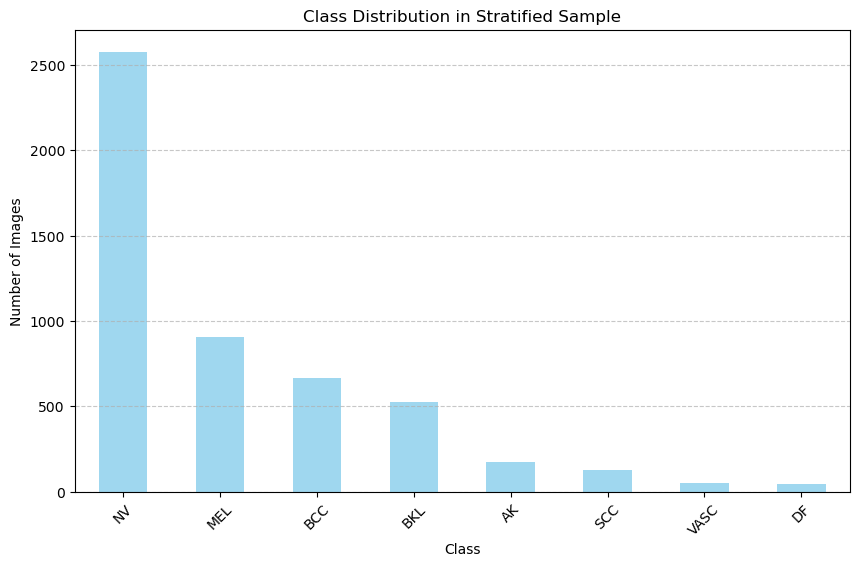

In [20]:
# Getting the class distribution in the stratified sample
class_distribution = stratified_sample['class'].value_counts()

# Printing the class distribution
print("Class Distribution in Stratified Sample:")
print(class_distribution)

# Optionally, display as percentages
class_percentage = stratified_sample['class'].value_counts(normalize=True) * 100
print("\nClass Distribution as Percentages:")
print(class_percentage)

# Visualising the class distribution with a bar chart
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
class_distribution.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title("Class Distribution in Stratified Sample")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Data Preprocessing
### Hair Removal

/Users/inescocco/Desktop/ISIC2019/Hairy_images/ISIC_0000190.jpg
/Users/inescocco/Desktop/ISIC2019/Hairy_images/ISIC_0000157.jpg
/Users/inescocco/Desktop/ISIC2019/Hairy_images/ISIC_0000069.jpg
/Users/inescocco/Desktop/ISIC2019/Hairy_images/ISIC_0000467.jpg
/Users/inescocco/Desktop/ISIC2019/Hairy_images/ISIC_0000161.jpg


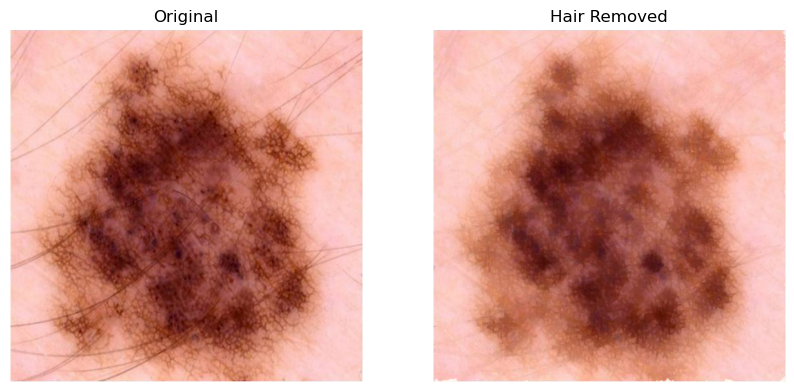

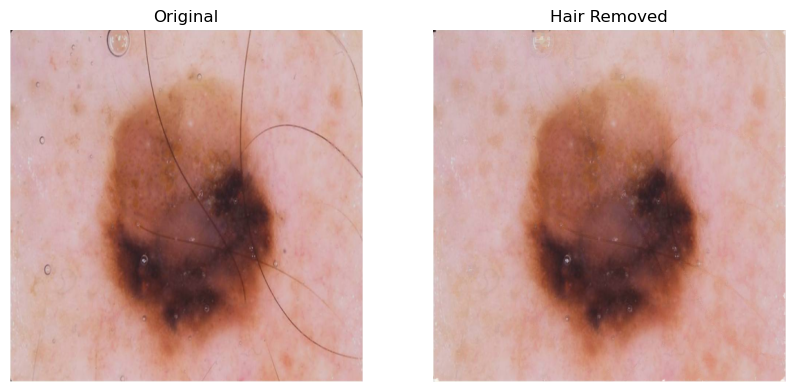

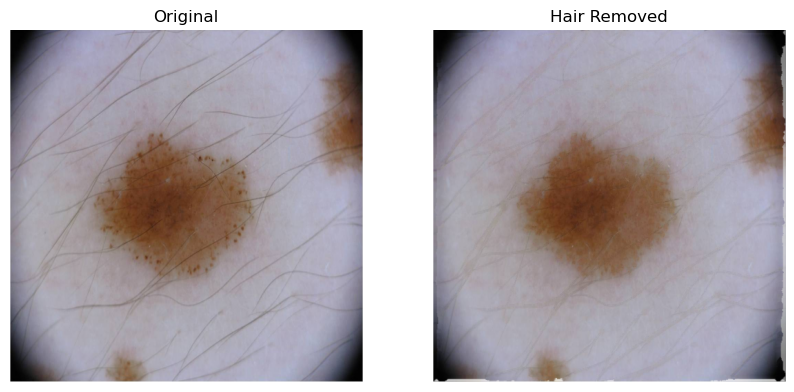

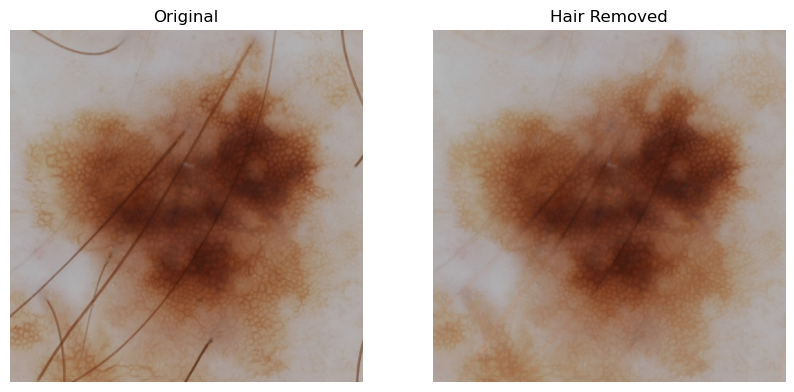

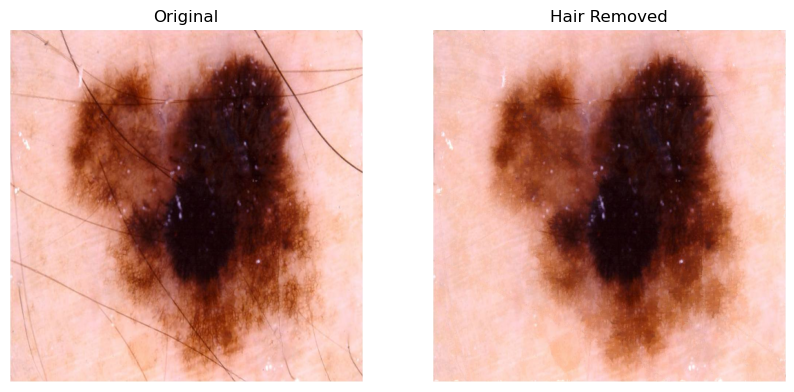

In [86]:
from glob import glob
def hair_remove(image):
    # converting image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))
    
    # applying MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    
    # applying thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)
    
    # inpainting with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)
    
    return final_image

# Images folder path
folder_path = '/Users/inescocco/Desktop/ISIC2019/Hairy_images'
hair_images = glob(os.path.join(folder_path, '*.jpg'))


for i,image_name in enumerate(hair_images):
    print(image_name)

    fig = plt.figure(figsize=(10,5))
    
    image = cv2.imread(image_name)
    image_resize = cv2.resize(image,(512,512))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original')
    
    final_image = hair_remove(image_resize)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Hair Removed')
    
    plt.plot()
    

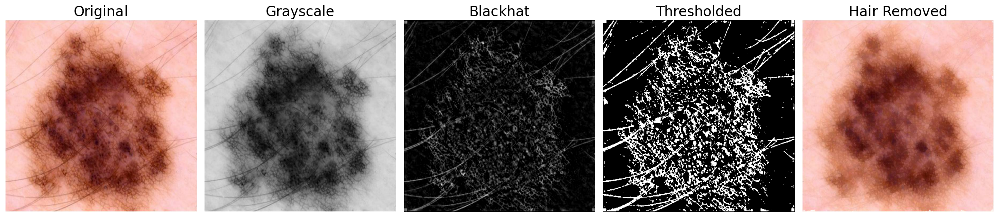

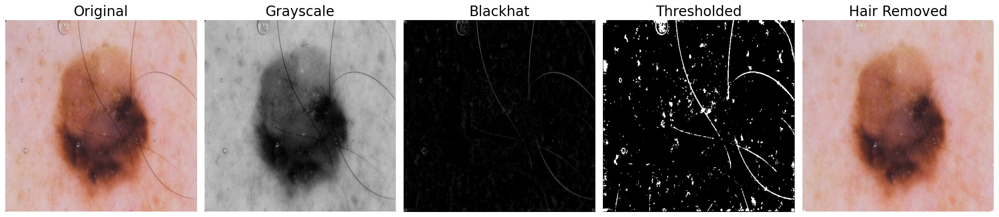

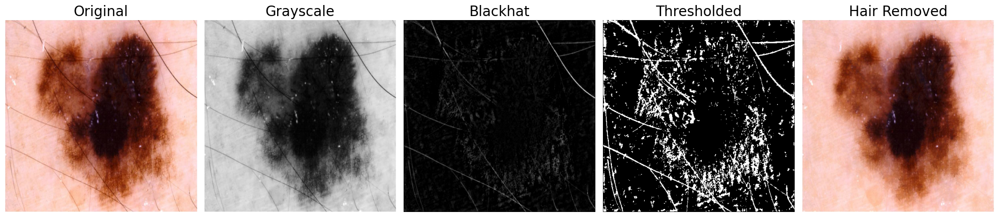

In [106]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os

def hair_remove(image):
    # Step 1: Converting the image to grayscale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    #print("Step 1: Converted to Grayscale")
    
    # Step 2: Creating kernel for morphologyEx
    kernel = cv2.getStructuringElement(1, (17, 17))  # Element shape: 1 means ellipse
    #print("Step 2: Created structuring element kernel")
    
    # Step 3: Applying morphological transformation (BLACKHAT)
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    #print("Step 3: Applied MorphologyEx (BLACKHAT)")

    # Step 4: Applying thresholding to the blackhat image
    _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
    #print("Step 4: Applied Thresholding")

    # Step 5: Inpainting the original image with threshold
    final_image = cv2.inpaint(image, threshold, 1, cv2.INPAINT_TELEA)
    #print("Step 5: Inpainted the image")
    
    return grayScale, blackhat, threshold, final_image


# Images folder path
folder_path = '/Users/inescocco/Desktop/ISIC2019/Hairy_images'
hair_images = glob(os.path.join(folder_path, '*.jpg'))

for i, image_name in enumerate(hair_images):
    
    # Loading and resize image
    image = cv2.imread(image_name)
    image_resize = cv2.resize(image, (512, 512))

    # Getting the intermediate results
    grayScale, blackhat, threshold, final_image = hair_remove(image_resize)

    # Displaying the images side by side (5 steps in one row)
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    # Showing original image
    axes[0].imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original', fontsize = 20)
    axes[0].axis('off')

    # Showing grayscale image
    axes[1].imshow(grayScale, cmap='gray')
    axes[1].set_title('Grayscale', fontsize = 20)
    axes[1].axis('off')

    # Showing blackhat image
    axes[2].imshow(blackhat, cmap='gray')
    axes[2].set_title('Blackhat', fontsize = 20)
    axes[2].axis('off')

    # Showing thresholded image
    axes[3].imshow(threshold, cmap='gray')
    axes[3].set_title('Thresholded', fontsize = 20)
    axes[3].axis('off')

    # Showing final inpainted image
    axes[4].imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    axes[4].set_title('Hair Removed', fontsize = 20)
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()


In [93]:
from glob import glob
def new_hairless_images(folder_name1, folder_name2):
    directory_old = os.path.join("/Users/inescocco/Desktop/isic_2019/", folder_name1)
    directory_new = os.path.join("/Users/inescocco/Desktop/isic_2019/", folder_name2)
    hair_images = glob(os.path.join(directory_old, '*.jpg'))

    # Ensuring the output directory exists
    os.makedirs(directory_new, exist_ok=True)

    print(f"Processing images from: {directory_old}")
    print(f"Saving processed images to: {directory_new}")

    for image_name in tqdm(hair_images):
        image = cv2.imread(image_name)
        if image is None:
            print(f"Warning: Could not read image {image_name}. Skipping.")
            continue
        image_resize = cv2.resize(image, (512, 512))
        final_image = hair_remove(image_resize)
        base_name = os.path.basename(image_name)
        output_file = os.path.join(directory_new, base_name)
        cv2.imwrite(output_file, final_image)

    print("Processing complete")
    
new_hairless_images('ISIC_2019_Training_Input', 'Hairless_images')

Processing images from: /Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_Input
Saving processed images to: /Users/inescocco/Desktop/isic_2019/Hairless_images


0it [00:00, ?it/s]

Processing complete


## Stratified Split into Training, Validation and Test Data

In [50]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

# Loading the CSV file with labels
csv_path = '/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Loading images
image_dir = '/Users/inescocco/Desktop/isic_2019/Hairless_images' 
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Removing '.jpg' extension from the image files to match CSV labels
image_files_no_ext = [f.replace('.jpg', '') for f in image_files]

# Filtering CSV to only include images present in the folder
df = df[df['image'].isin(image_files_no_ext)]

# Getting the column name (class) with the value 1.0
df['class'] = df.iloc[:, 1:].idxmax(axis=1)

# Step 1: Performing stratified split (70% training, 30% for validation + test)
train_df, temp_df = train_test_split(
    df,
    test_size=0.4,
    stratify=df['class'],
    random_state=42
)

# Step 2: Performing stratified split on the temp data (50% validation, 50% test)
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,  # 50% of temp_df will go to test set
    stratify=temp_df['class'],
    random_state=42
)

# Getting the lists of image names for each split
train_image_list = train_df['image'].tolist()
val_image_list = val_df['image'].tolist()
test_image_list = test_df['image'].tolist()

# Creating paths for new folders
train_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train'
val_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation'
test_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test'

# Creating the directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Step 3: Copying images to the respective directories
def copy_images(image_list, src_dir, dst_dir):
    for image_name in image_list:
        src_path = os.path.join(src_dir, f"{image_name}.jpg")
        dst_path = os.path.join(dst_dir, f"{image_name}.jpg")
        if os.path.exists(src_path):
            shutil.copy(src_path, dst_path)

# Copying the images for each set
copy_images(train_image_list, image_dir, train_dir)
copy_images(val_image_list, image_dir, val_dir)
copy_images(test_image_list, image_dir, test_dir)

print(f"Copied {len(train_image_list)} images to {train_dir}.")
print(f"Copied {len(val_image_list)} images to {val_dir}.")
print(f"Copied {len(test_image_list)} images to {test_dir}.")


Copied 15198 images to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train.
Copied 5066 images to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation.
Copied 5067 images to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test.


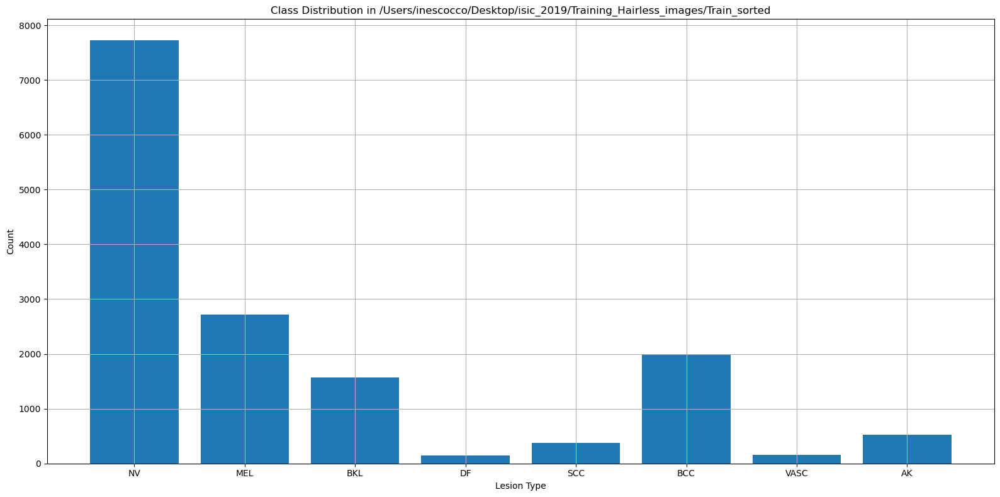

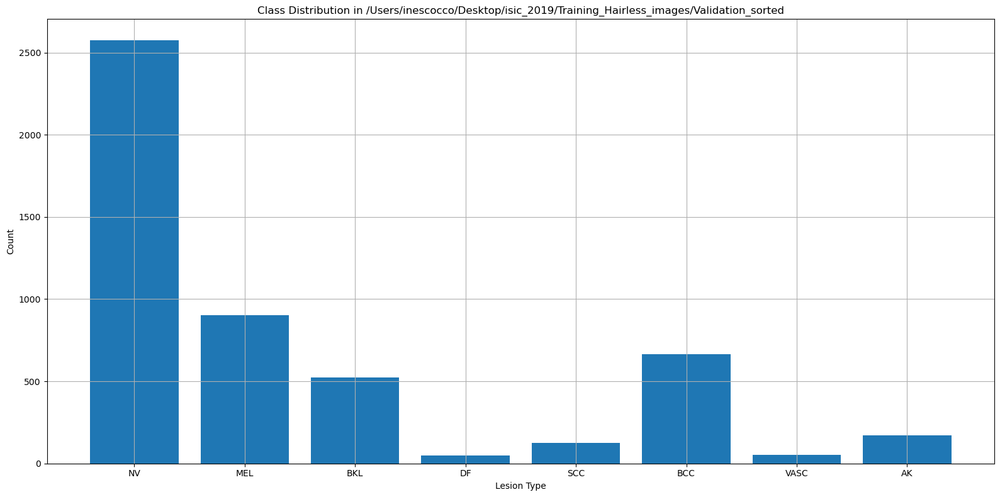

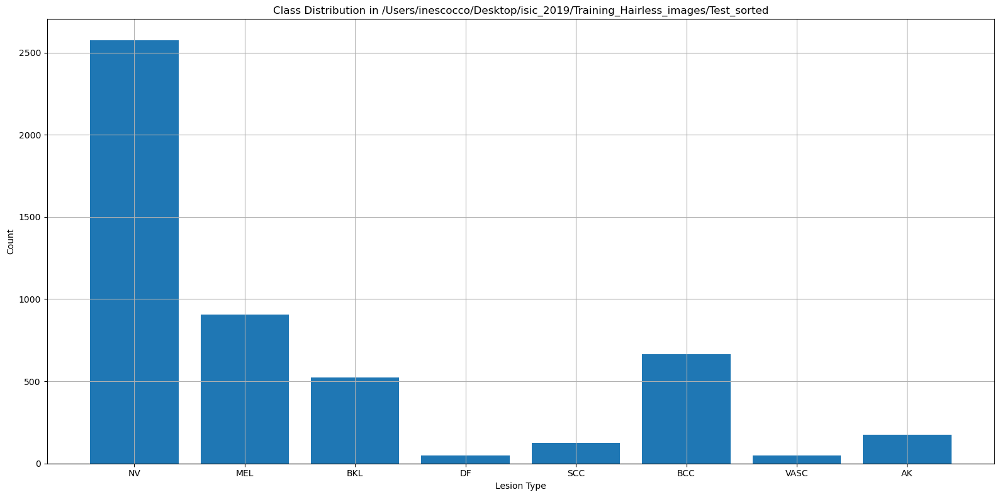

Class Distribution in /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted:
NV: 7725 images
SCC: 377 images
BKL: 1574 images
MEL: 2713 images
BCC: 1994 images
DF: 143 images
AK: 520 images
VASC: 152 images


In [32]:
def plot_class_distribution(df, image_list, folder_path):
    # Counting occurrences of each class in the image list
    class_counts = Counter()
    for image_name in image_list:
        class_label = df[df['image'] == image_name]['class'].values[0]
        class_counts[class_label] += 1

    # Converting class counts to a list of totals
    totals = [class_counts.get(label, 0) for label in df['class'].unique()]
    
    # Plotting the class distribution as a bar chart
    plt.figure(figsize=(16, 8))
    plt.bar(df['class'].unique(), totals)
    plt.xlabel("Lesion Type")
    plt.ylabel("Count")
    plt.title(f"Class Distribution in {folder_path}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_class_distribution(df, train_image_list, train_dir)
plot_class_distribution(df, val_image_list, val_dir)
plot_class_distribution(df, test_image_list, test_dir)


def print_class_distribution(df, image_list, folder_path):
    # Counting occurrences of each class in the image list
    class_counts = Counter()
    for image_name in image_list:
        class_label = df[df['image'] == image_name]['class'].values[0]
        class_counts[class_label] += 1

    # Printing the class distribution as numbers
    print(f"Class Distribution in {folder_path}:")
    for label, count in class_counts.items():
        print(f"{label}: {count} images")

# Printing the class distribution for each folder
print_class_distribution(df, train_image_list, train_dir)

## Data Augmentation

In [32]:
# Functioning to create subfolders for each lesion type and move images to those folders
def organize_images_by_class(image_list, src_dir, dst_dir, df, class_column):
    for image_name in image_list:
        # Getting the class label of the image from the DataFrame
        class_label = df[df['image'] == image_name][class_column].values[0]
        
        # Creating a directory for the class label if it doesn't exist
        class_folder = os.path.join(dst_dir, str(class_label))
        os.makedirs(class_folder, exist_ok=True)
        
        # Constructing source and destination paths
        src_path = os.path.join(src_dir, f"{image_name}.jpg")
        dst_path = os.path.join(class_folder, f"{image_name}.jpg")
        
        # Moving the image to the corresponding class folder
        if os.path.exists(src_path):
            shutil.copy(src_path, dst_path)
            print(f"Moved {image_name} to {class_folder}")



In [34]:
# Getting the lists of image names for each split
train_image_list = train_df['image'].tolist()

image_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train'

# Creating the paths for the subfolders for each class within the training folder
train_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted'

# Step 2: Creating a dictionary for each lesion type with its respective image list
lesion_types = df['class'].unique()

# Organising the images in the training folder by lesion type
organize_images_by_class(train_image_list, image_dir, train_dir, df, 'class')

print(f"Images have been organized into subfolders by skin lesion type.")

NameError: name 'train_df' is not defined

Moved ISIC_0057777 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068853 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0067888 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0032815 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0030267 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025351 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0029606 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0056886 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/SCC
Moved ISIC_0056257 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027537 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_002437

Moved ISIC_0015937_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0064608 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0059707 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0054027 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062162 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033256 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/DF
Moved ISIC_0028613 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0073091 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0000039_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0010864 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_so

Moved ISIC_0012813_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0067431 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0000355 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029564 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0014577_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0062341 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0059597 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0054569 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0061556 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0064393 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train

Moved ISIC_0031033 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0064866 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068391 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0028505 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0068200 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0065629 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0057892 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0015984_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0033439 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0055143 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Move

Moved ISIC_0013594_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0030092 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0067179 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0072412 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0071690 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_0013986_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0062844 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0054936 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0009941 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0058784 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_so

Moved ISIC_0073039 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0055027 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0032400 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0024868 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027534 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029406 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0071593 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0063014 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0026902 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0057272 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_00

Moved ISIC_0060700 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033138 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0059481 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0066595 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_0014729_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025062 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0063167 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0016024_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0066050 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0024446 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sor

Moved ISIC_0058074 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/SCC
Moved ISIC_0063272 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0061127 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0031138 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0010493 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0026347 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068737 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0059080 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0061018 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025905 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029

Moved ISIC_0033204 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0030163 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0059985 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_0059239 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0031292 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_0060654 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0012658_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0024801 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0011081 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0031593 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved

Moved ISIC_0062420 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0072050 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0068576 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0011296 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0026854 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0014114_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0032673 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025720 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0073012 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/VASC
Moved ISIC_0030856 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Mov

Moved ISIC_0067590 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0058630 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0054185 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033553 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0014324_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0070714 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0027711 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0058775 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0069530 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0069134 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Mo

Moved ISIC_0065585 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0013277_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0072293 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0028956 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0070548 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029632 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0031428 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0068539 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0032548 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0057449 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Mov

Moved ISIC_0029127 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068928 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0030649 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0032153 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029602 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0072097 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0073227 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0058158 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0054055 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0059448 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_007

Moved ISIC_0000518 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0026195 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0030616 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0058808 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0030871 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029380 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0072771 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0056290 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/SCC
Moved ISIC_0073238 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0026444 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0024

Moved ISIC_0027669 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0072531 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0067614 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0068632 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0063683 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0034265 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0055302 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/SCC
Moved ISIC_0028138 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027871 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0067427 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029

Moved ISIC_0071917 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0073133 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0032852 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0064200 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0010334 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0072567 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0030059 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0071892 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0032425 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0028150 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062

Moved ISIC_0070267 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0024788 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0016007_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0033167 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0014093_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0055451 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0015386_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0054538 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029562 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033118 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_image

Moved ISIC_0070208 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0056663 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0032909 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0032888 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0055844 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_0009899 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0066380 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0064141 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0029522 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0026495 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0065

Moved ISIC_0032423 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0010565 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062873 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068786 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0011366 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0013625_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0026690 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0063300 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0062352 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0026874 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Mov

Moved ISIC_0031534 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0060859 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0013577_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0034061 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0065136 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0061010 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0058829 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027460 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0069569 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0072635 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Move

Moved ISIC_0015109_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0071722 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0064320 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0010494 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0012888_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0028722 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0058151 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0056380 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027911 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0055658 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_so

Moved ISIC_0032775 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/VASC
Moved ISIC_0029275 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0009946 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0014336_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0026248 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0032024 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0058318 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/SCC
Moved ISIC_0032989 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0024818 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0069239 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Mo

Moved ISIC_0062834 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0072534 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0069232 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0064626 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0056167 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0058603 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068697 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068338 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0058556 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0028739 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0

Moved ISIC_0026795 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0026548 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0054461 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0011173 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0010367 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0024472 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0031338 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062677 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068451 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0072467 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_006371

Moved ISIC_0070958 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0069013 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0059010 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0055567 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0030604 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033457 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0031262 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0060307 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0063525 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0069939 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/AK
Moved ISIC_00307

Moved ISIC_0031439 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0028146 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/VASC
Moved ISIC_0058368 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0029782 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0000313 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0064288 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0054043 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0000503 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0030042 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0056533 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0070

Moved ISIC_0066511 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0063697 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0057390 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0061692 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0063997 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025565 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0031946 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0028142 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0060091 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0069484 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_006

Moved ISIC_0031465 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0027458 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0027517 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0059494 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/DF
Moved ISIC_0013965_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0009970 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0014963_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0033060 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0025431 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0071008 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_s

Moved ISIC_0010241 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0068234 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0054307 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068240 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0030989 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0029316 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0031974 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0014081_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0030174 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0071199 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Mov

Moved ISIC_0064936 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0027685 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0033444 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0061303 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0024451 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062006 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0032602 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/MEL
Moved ISIC_0057587 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0054041 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0025335 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_007

Moved ISIC_0011339 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0028637 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0033148 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0068007 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0072942 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BCC
Moved ISIC_0014715_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/NV
Moved ISIC_0062968 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0065701 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/BKL
Moved ISIC_0031996 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_sorted/VASC
Moved ISIC_0013456_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Train_s

In [53]:
import os
import shutil
import pandas as pd

# Loading the CSV file with labels
csv_path = '/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Checking if 'class' column exists
if 'class' not in df.columns:
    df['class'] = df.iloc[:, 1:].idxmax(axis=1) 

# Getting the lists of image names for the validation split
val_image_list = val_df['image'].tolist()

val_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted'

# Ensuring the output directory exists
os.makedirs(val_dir, exist_ok=True)

# Organising the validation images into subfolders based on their class
organize_images_by_class(val_image_list, '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation', val_dir, df, 'class')

print(f"Validation images have been organized into subfolders by skin lesion type.")


Moved ISIC_0070885 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0054325 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0059621 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0056724 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/AK
Moved ISIC_0060797 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0034180 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0014131_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0065846 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0069676 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0030703 to /Users/inescocco/Desktop/isic_2019/

Moved ISIC_0058823 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0064222 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/AK
Moved ISIC_0011227 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0026607 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0027075 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0060119 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0015939_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0059724 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0061847 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0053469 to /Users/inescocco/Desktop/isic_2019/T

Moved ISIC_0059826 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0014475_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0055221 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0056821 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/SCC
Moved ISIC_0070232 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/AK
Moved ISIC_0066649 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0056470 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0014839_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0014120_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0072833 to /Users/ine

Moved ISIC_0062459 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0058442 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/DF
Moved ISIC_0025310 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0028534 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0054449 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0033682 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0070802 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0010017 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0031150 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0059467 to /Users/inescocco/Desktop/isic_2019/Training_Hair

Moved ISIC_0070486 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/AK
Moved ISIC_0025681 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0056976 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0032693 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0058570 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0010597 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0067756 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0054464 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0067439 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BCC
Moved ISIC_0054977 to /Users/inescocco/Desktop/isic_2019/Training_Ha

Moved ISIC_0033874 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0072730 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0055611 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0032674 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0061236 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0013090_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0065175 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0054039 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0032546 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0033389 to /Users/inescocco/Desktop/isic_2019/Tr

Moved ISIC_0014793_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0057406 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0057510 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/SCC
Moved ISIC_0026301 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/BKL
Moved ISIC_0000500 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0063619 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0060668 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0067159 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/MEL
Moved ISIC_0070399 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Validation_sorted/NV
Moved ISIC_0029780 to /Users/inescocco/Desktop/isic_2019

In [54]:
# Loading the CSV file with labels
csv_path = '/Users/inescocco/Desktop/isic_2019/ISIC_2019_Training_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Checking if 'class' column exists
if 'class' not in df.columns:
    df['class'] = df.iloc[:, 1:].idxmax(axis=1) 

# Getting the lists of image names for the validation split
test_image_list = test_df['image'].tolist()

test_dir = '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted'


# Ensuring the output directory exists
os.makedirs(test_dir, exist_ok=True)

# Organising the validation images into subfolders based on their class
organize_images_by_class(test_image_list, '/Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test', test_dir, df, 'class')

print(f"Validation images have been organized into subfolders by skin lesion type.")


Moved ISIC_0062734 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0032507 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0026376 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0034133 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0057412 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0053554 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0013988_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0031201 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/VASC
Moved ISIC_0057236 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/DF
Moved ISIC_0069343 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_00

Moved ISIC_0069862 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0025108 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0033850 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0012932_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BKL
Moved ISIC_0058472 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BCC
Moved ISIC_0025524 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0028608 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0029697 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0067966 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0068627 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_006

Moved ISIC_0024404 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0024668 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0068061 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0053591 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BCC
Moved ISIC_0030721 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BKL
Moved ISIC_0070715 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0069188 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BCC
Moved ISIC_0063163 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BKL
Moved ISIC_0015464_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0025814 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_00

Moved ISIC_0071955 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BCC
Moved ISIC_0033120 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0058274 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0015973_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0033596 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0071916 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0057338 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0057771 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0065057 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0060509 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/AK
Moved ISIC_0

Moved ISIC_0071782 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0012265_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BKL
Moved ISIC_0055332 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0034282 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0016004_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0054838 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0053652 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0029378 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0032881 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0029724 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Move

Moved ISIC_0054499 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0027851 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/BCC
Moved ISIC_0028468 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0030697 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0072085 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0064887 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0069562 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0010473 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0065307 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/MEL
Moved ISIC_0013713_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0032

Moved ISIC_0054315 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/SCC
Moved ISIC_0015125_downsampled to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Moved ISIC_0069495 to /Users/inescocco/Desktop/isic_2019/Training_Hairless_images/Test_sorted/NV
Validation images have been organized into subfolders by skin lesion type.


In [33]:
def generate_lesion_arrays(label_number, folder_name):
    # Building path to the folder containing the images
    folder_path = os.path.join("/Users/inescocco/Desktop/isic_2019/Hairless_images", folder_name)
    
    # Verifying the path is correct
    print(f"Looking for images in: {folder_path}")
    
    # Using glob to search for all .jpg files in the folder
    skin_lesion_names = glob(os.path.join(folder_path, "*.jpg"))
    
    # Checking if any images are found
    if not skin_lesion_names:
        print("No .jpg images found in this folder.")
    else:
        print(f"Found {len(skin_lesion_names)} image(s).")
    
    # Saving directory path
    save_directory = os.path.join('/Users/inescocco/Desktop/isic_2019/Training_Hairless_images', folder_name)
    
    # Initialising list for storing image arrays
    lesion_arrays = []
    
    # Iterating over each image path and load the image
    for image_path in skin_lesion_names:
        try:
            # Opening image, resize it to 512x512, and convert it to an array
            img_data = Image.open(image_path).resize((512, 512))
            img = tf.keras.preprocessing.image.array_to_img(img_data)  # Convert to a PIL image
            array = tf.keras.preprocessing.image.img_to_array(img)  # Convert the PIL image to an array
            lesion_arrays.append(array)
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

    return skin_lesion_names, lesion_arrays, save_directory


In [34]:
BCC_names, BCC_image_array, BCC_directory = generate_lesion_arrays(2, '2_BCC')

print(BCC_names)

Looking for images in: /Users/inescocco/Desktop/isic_2019/Hairless_images/2_BCC
No .jpg images found in this folder.
[]


In [36]:
def image_augmentation_rotation90(image_labels,image_array,directory):
    count = 0
    image_array_mod = np.rot90(image_array, axes=(2,1))
    for i in image_array_mod:
        img = i 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "rot_90.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1
        

In [38]:
def image_augmentation_rotation180(image_labels,image_array,directory):
    count = 0
    image_array_mod = np.rot90(image_array, k = 2, axes=(2,1))
    for i in image_array_mod:
        img = i 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "rot_180.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [40]:
def image_augmentation_rotation270(image_labels,image_array,directory):
    count = 0
    image_array_mod = np.rot90(image_array, k = 3, axes=(2,1))
    for i in image_array_mod:
        img = i
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "rot_270.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [42]:
def plane_noise_white(image_labels,image_array, directory):
    """
    Adds a plane to the STM image.
    """
    count = 0
    value =50
    for i in image_array:
        mat = np.ones(i.shape,dtype = 'float32')*value
        brighter = cv2.add(i,mat)
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "planenoisewhite.jpg", cv2.cvtColor(brighter, cv2.COLOR_RGB2BGR))

        count += 1

In [44]:
def plane_noise_dark(image_labels,image_array, directory):
    """
    Adds a plane to the STM image.
    """
    count = 0
    value =50
    for i in image_array:
        mat = np.ones(i.shape,dtype = 'float32')*value
        brighter = cv2.subtract(i,mat)
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "planenoisedark.jpg", cv2.cvtColor(brighter, cv2.COLOR_RGB2BGR))

        count += 1

In [46]:
def blur(image_labels,image_array,directory):
    count = 0
    for i in image_array:
        img = cv2.blur(i,(10,10)) 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "blur.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1
        
def more_blur(image_labels,image_array,directory):
    count = 0
    for i in image_array:
        img = cv2.blur(i,(20,20)) 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "moreblur.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [48]:
def vert_flip(image_labels,image_array,directory):
    count = 0
    for i in image_array:
        img = np.flip(i, axis=(2,1))  
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "vert_flip.jpg", img)#, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [50]:
def vert_flip_90(image_labels,image_array,directory):
    count = 0
    image_array = np.rot90(image_array, axes=(2,1))
    for i in image_array:
        img = np.flip(i, axis=(2,1)) 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "vert_flip_90.jpg", img)#, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [52]:
def vert_flip_180(image_labels,image_array,directory):
    count = 0
    image_array = np.rot90(image_array, k = 2,  axes=(2,1))
    for i in image_array:
        img = np.flip(i, axis=(2,1)) 
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "vert_flip_180.jpg", img)#, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [54]:
def vert_flip_270(image_labels,image_array,directory):
    count = 0
    image_array = np.rot90(image_array, k = 3,  axes=(2,1))
    for i in image_array:
        img = np.flip(i, axis=(2,1))
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "vert_flip_270.jpg", img)#, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

In [56]:
def zoom(image_labels,image_array,directory):
    count = 0
    value = random.uniform(0.5, 1)
    for i in image_array:
        img = i
        h, w = img.shape[:2]
        h_taken = int(value*h)
        w_taken = int(value*w)
        h_start = random.randint(0, h-h_taken)
        w_start = random.randint(0, w-w_taken)
        img = img[h_start:h_start+h_taken, w_start:w_start+w_taken, :]
        img = cv2.resize(img, (h, w), cv2.INTER_CUBIC)
        cv2.imwrite(directory + "AUG_" + image_labels[count] + "zoom.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        count += 1

<>:39: SyntaxWarning: invalid escape sequence '\c'
<>:42: SyntaxWarning: invalid escape sequence '\c'
<>:45: SyntaxWarning: invalid escape sequence '\c'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\c'
<>:57: SyntaxWarning: invalid escape sequence '\c'
<>:39: SyntaxWarning: invalid escape sequence '\c'
<>:42: SyntaxWarning: invalid escape sequence '\c'
<>:45: SyntaxWarning: invalid escape sequence '\c'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\c'
<>:57: SyntaxWarning: invalid escape sequence '\c'
/var/folders/w2/n9r9v5jn7dvcckzxkjyfjqlc0000gn/T/ipykernel_57895/2192156919.py:39: SyntaxWarning: invalid escape sequence '\c'
  ax[1,0].set_title("90$^\circ$Rotation", size=20)
/var/folders/w2/n9r9v5jn7dvcckzxkjyfjqlc0000gn/T/ipykernel_57895/2192156919.py:42: SyntaxWarning: invalid escape sequence '\c'
  ax[1,1].set_title("180$^\circ$Rotation", size=20)
/var/folders/w2/n9r9v5jn7dvcckz

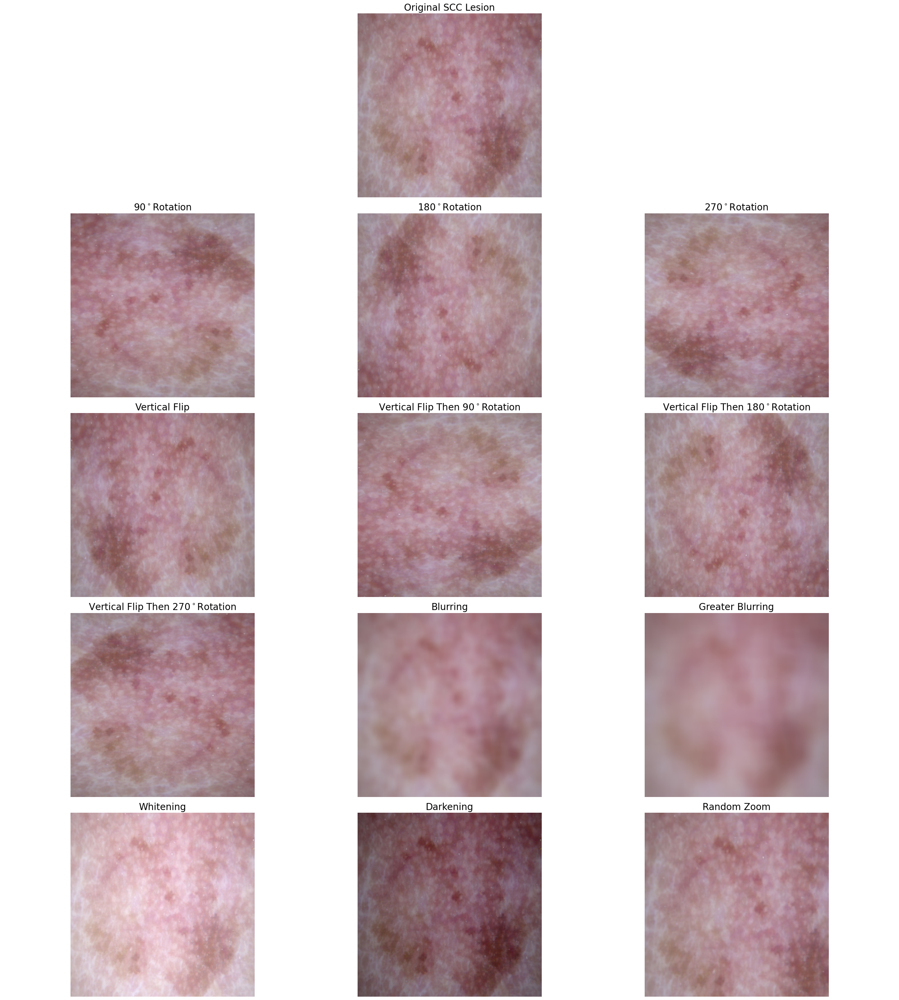

In [113]:
image = cv2.imread('/Users/inescocco/Desktop/ISIC2019/Train_sorted/AK/ISIC_0026626.jpg')[...,::-1]
image = cv2.resize(image, (224, 224))

#printing(image.dtype)
image_90 = np.rot90(image)
image_180 = np.rot90(image, k = 2)
image_270 = np.rot90(image, k = 3)

image_vert = np.flip(image, axis= (2,1))[...,::-1]
image_vert90 = np.rot90(image_vert)
image_vert180 = np.rot90(image_vert, k = 2)
image_vert270 = np.rot90(image_vert, k = 3)

image_blur = cv2.blur(image,(10,10)) 
image_blur2 = cv2.blur(image,(20,20))

value =50
mat = np.ones(image.shape,dtype = 'uint8')*value
image_brighter = cv2.add(image,mat)
image_darker = cv2.subtract(image,mat)

value = random.uniform(0.8, 1)
h, w = image.shape[:2]
h_taken = int(value*h)
w_taken = int(value*w)
h_start = random.randint(0, h-h_taken)
w_start = random.randint(0, w-w_taken)
image_zoom = image[h_start:h_start+h_taken, w_start:w_start+w_taken, :]
image_zoom = cv2.resize(image_zoom, (h, w), cv2.INTER_CUBIC)


# Showing images
fig, ax = plt.subplots(5, 3, figsize=(27,30))
[axi.set_axis_off() for axi in ax.ravel()]

ax[0,1].set_title("Original SCC Lesion", size=20)
ax[0,1].imshow(image)

ax[1,0].set_title("90$^\circ$Rotation", size=20)
ax[1,0].imshow(image_90)

ax[1,1].set_title("180$^\circ$Rotation", size=20)
ax[1,1].imshow(image_180)

ax[1,2].set_title("270$^\circ$Rotation", size=20)
ax[1,2].imshow(image_270)

ax[2,0].set_title("Vertical Flip", size=20)
ax[2,0].imshow(image_vert)

ax[2,1].set_title("Vertical Flip Then 90$^\circ$Rotation", size=20)
ax[2,1].imshow(image_vert90)

ax[2,2].set_title("Vertical Flip Then 180$^\circ$Rotation", size=20)
ax[2,2].imshow(image_vert180)

ax[3,0].set_title("Vertical Flip Then 270$^\circ$Rotation", size=20)
ax[3,0].imshow(image_vert270)

ax[3,1].set_title("Blurring", size=20)
ax[3,1].imshow(image_blur)

ax[3,2].set_title("Greater Blurring", size=20)
ax[3,2].imshow(image_blur2)

ax[4,0].set_title("Whitening", size=20)
ax[4,0].imshow(image_brighter)

ax[4,1].set_title("Darkening", size=20)
ax[4,1].imshow(image_darker)


ax[4,2].set_title("Random Zoom", size=20)
ax[4,2].imshow(image_zoom)

fig.tight_layout()

<>:40: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\c'
<>:40: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\c'
/var/folders/w2/n9r9v5jn7dvcckzxkjyfjqlc0000gn/T/ipykernel_57895/1247284119.py:40: SyntaxWarning: invalid escape sequence '\c'
  ax[0,1].set_title("90$^\circ$Rotation", size=27)
/var/folders/w2/n9r9v5jn7dvcckzxkjyfjqlc0000gn/T/ipykernel_57895/1247284119.py:49: SyntaxWarning: invalid escape sequence '\c'
  ax[1,0].set_title("Vertical Flip Then 90$^\circ$Rotation", size=27)


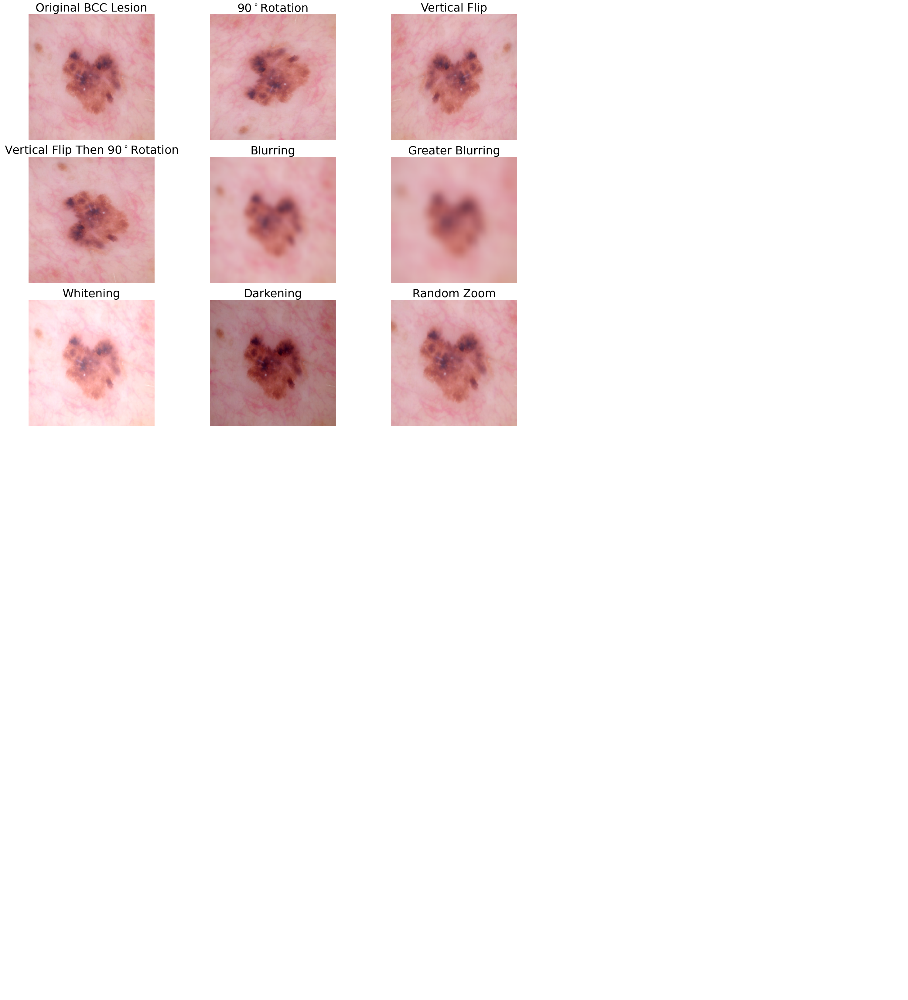

In [82]:
image = cv2.imread('/Users/inescocco/Desktop/ISIC2019/Train_sorted/BCC/ISIC_0027004.jpg')[...,::-1]
#image = cv2.imread('/Users/inescocco/Desktop/isic_2019/Hairless_images/BCC/ISIC_0026453.jpg')[...,::-1]
image = cv2.resize(image, (224, 224))

#print(image.dtype)
image_90 = np.rot90(image)
image_180 = np.rot90(image, k = 2)
image_270 = np.rot90(image, k = 3)

image_vert = np.flip(image, axis= (2,1))[...,::-1]
image_vert90 = np.rot90(image_vert)
image_vert180 = np.rot90(image_vert, k = 2)
image_vert270 = np.rot90(image_vert, k = 3)

image_blur = cv2.blur(image,(10,10)) 
image_blur2 = cv2.blur(image,(20,20))

value =50
mat = np.ones(image.shape,dtype = 'uint8')*value
image_brighter = cv2.add(image,mat)
image_darker = cv2.subtract(image,mat)

value = random.uniform(0.8, 1)
h, w = image.shape[:2]
h_taken = int(value*h)
w_taken = int(value*w)
h_start = random.randint(0, h-h_taken)
w_start = random.randint(0, w-w_taken)
image_zoom = image[h_start:h_start+h_taken, w_start:w_start+w_taken, :]
image_zoom = cv2.resize(image_zoom, (h, w), cv2.INTER_CUBIC)


# Showing images
fig, ax = plt.subplots(7, 5, figsize=(30,33))
[axi.set_axis_off() for axi in ax.ravel()]

ax[0,0].set_title("Original BCC Lesion", size=27)
ax[0,0].imshow(image)

ax[0,1].set_title("90$^\circ$Rotation", size=27)
ax[0,1].imshow(image_90)



ax[0,2].set_title("Vertical Flip", size=27)
ax[0,2].imshow(image_vert)


ax[1,0].set_title("Vertical Flip Then 90$^\circ$Rotation", size=27)
ax[1,0].imshow(image_vert90)



ax[1,1].set_title("Blurring", size=27)
ax[1,1].imshow(image_blur)

ax[1,2].set_title("Greater Blurring", size=27)
ax[1,2].imshow(image_blur2)

ax[2,0].set_title("Whitening", size=27)
ax[2,0].imshow(image_brighter)

ax[2,1].set_title("Darkening", size=27)
ax[2,1].imshow(image_darker)


ax[2,2].set_title("Random Zoom", size=27)
ax[2,2].imshow(image_zoom)

fig.tight_layout()

In [60]:
data_dir = "/Users/inescocco/Desktop/ISIC2019/Train_sorted_2"

# Getting all lesion type folders
lesion_folders = [os.path.join(data_dir, folder) for folder in sorted(os.listdir(data_dir)) if os.path.isdir(os.path.join(data_dir, folder))]

# Finding the folder with the largest number of images
folder_sizes = {folder: len(os.listdir(folder)) for folder in lesion_folders}
max_size = max(folder_sizes.values())

print(f"Max folder size: {max_size}")

# Define augmentation functions
def augment_image(image):
    augmented_images = []

    # Resizing
    image = cv2.resize(image, (224, 224))

    # Rotations
    augmented_images.append(np.rot90(image))
    augmented_images.append(np.rot90(image, k=2))
    augmented_images.append(np.rot90(image, k=3))

    # Vertical flip and rotations
    image_vert = np.flip(image, axis=(2, 1))[..., ::-1]
    augmented_images.append(image_vert)
    augmented_images.append(np.rot90(image_vert))
    augmented_images.append(np.rot90(image_vert, k=2))
    augmented_images.append(np.rot90(image_vert, k=3))

    # Blurring
    augmented_images.append(cv2.blur(image, (10, 10)))
    augmented_images.append(cv2.blur(image, (20, 20)))

    # Brightening and darkening
    value = 50
    mat = np.ones(image.shape, dtype='uint8') * value
    augmented_images.append(cv2.add(image, mat))  # Brighter
    augmented_images.append(cv2.subtract(image, mat))  # Darker

    # Random zoom
    value = random.uniform(0.8, 1)
    h, w = image.shape[:2]
    h_taken = int(value * h)
    w_taken = int(value * w)
    h_start = random.randint(0, h - h_taken)
    w_start = random.randint(0, w - w_taken)
    image_zoom = image[h_start:h_start + h_taken, w_start:w_start + w_taken, :]
    image_zoom = cv2.resize(image_zoom, (h, w), cv2.INTER_CUBIC)
    augmented_images.append(image_zoom)

    return augmented_images

# Augment images for each folder
for folder in lesion_folders:
    lesion_type = os.path.basename(folder)
    print(f"Processing {lesion_type}...")

    images = [os.path.join(folder, img) for img in os.listdir(folder) if img.endswith(('.jpg', '.png'))]
    num_images = len(images)

    # Creating augmented images until the folder matches the largest size
    augmented_count = 0
    while num_images + augmented_count < max_size:
        for img_path in images:
            # Reading the image
            image = cv2.imread(img_path)[..., ::-1]

            # Applying augmentations
            augmented_images = augment_image(image)

            # Saving augmented images
            for aug_img in augmented_images:
                if num_images + augmented_count >= max_size:
                    break

                # Saving image
                save_path = os.path.join(folder, f"augmented_{augmented_count}.jpg")
                cv2.imwrite(save_path, cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))
                augmented_count += 1

    print(f"Folder {lesion_type} now has {num_images + augmented_count} images.")

print("Augmentation complete.")

Max folder size: 3719
Processing AK...
Folder AK now has 3719 images.
Processing BCC...
Folder BCC now has 3719 images.
Processing BKL...
Folder BKL now has 3719 images.
Processing DF...
Folder DF now has 3719 images.
Processing MEL...
Folder MEL now has 3719 images.
Processing NV...
Folder NV now has 3719 images.
Processing SCC...
Folder SCC now has 3719 images.
Processing VASC...
Folder VASC now has 3719 images.
Augmentation complete.
